In [1]:
#'''
import numpy as np
import pandas as pd
import pyjags
import pystan
import stan_utility_copy
import pickle
import matplotlib.pyplot as plt
#'''
from pystan import StanModel
from __future__ import division, print_function
from pandas.tools.plotting import *
from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["font.size"] = 20
#plt.style.use('ggplot')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
#%qtconsole





In [2]:
## function to draw from truncated normal, this function will be used for both the 
## one- and two-componenet cases in this workbook.  

def rnorm_bound( Ndata, mu, prec, lower_bound = 0.0, upper_bound = float('Inf')):
    x = np.zeros(Ndata)
    #print(x)
    for i in range(0, Ndata): 
            #print(i)
            while True:
                x[i] = np.random.normal(mu,prec,1)
                if( (x[i]>lower_bound) and (x[i]<upper_bound) ): 
                    break
    return x;

In [20]:
## Below we designate the population values of our two-component truncated Gaussian 
## generative model. These are the truths that we should recover if our hiararchical 
## Bayesian model is properly specified and diagnostics have indicated that the simulation 
## has "not not converged".
Ndata = 500
Nm = 2
frac = [0.7,0.3]
sigmae = [0.05,0.3]

## After generating values from the population model, we now add realistic Gaussian noise 
## to create simulated measurements. 
#sigmahobs = 0.04
#sigmakobs = 0.08
sigmahobs = 0.001
sigmakobs = 0.001

h = np.repeat(0.,Ndata)
k = np.repeat(0.,Ndata)
hhat = np.repeat(0.,Ndata)
khat = np.repeat(0.,Ndata)
hhat_sigma  = np.repeat(sigmahobs,Ndata)
khat_sigma  = np.repeat(sigmakobs,Ndata)

#print(khat_sigma)

for i in range(0,Ndata):
    #print('i')
    #print(i)
    
    c = np.random.choice(len(frac), 1, p=frac, replace=True)
    #print(int(c))
    h[i] = rnorm_bound(1,0,sigmae[int(c)],lower_bound=-1,upper_bound=1)
    # Euler's formula: h^2 + k^2 = 1
    lb = -np.sqrt(1-h[i]**2)
    ub = np.sqrt(1-h[i]**2)
    k[i] = rnorm_bound(1,0,sigmae[int(c)],lower_bound=lb,upper_bound=ub) 
    hhat[i] = rnorm_bound(1,h[i],sigmahobs,lower_bound=-1,upper_bound=1)
    khat[i] = rnorm_bound(1,k[i],sigmakobs,lower_bound=lb,upper_bound=ub)

    
print(h, hhat, k, khat)
print(k.shape)

[ -8.74643517e-01  -8.60857162e-02   1.96376887e-01   1.81215344e-02
   2.26518164e-02   2.30456833e-02  -5.85058447e-02   4.19160449e-02
  -8.65375488e-02  -6.47381976e-03   9.47477842e-02   1.51810190e-02
   8.29904378e-02   3.01110135e-02  -2.38489248e-01   2.89194129e-01
  -1.31832300e-01  -5.24890616e-02  -8.94247986e-02  -1.45925464e-01
  -6.56104207e-03  -5.83371482e-02   1.49725752e-02   4.95596868e-02
   3.41254211e-02   1.50074624e-02   1.35123636e-02   6.60264752e-02
  -4.40117651e-02  -6.06274817e-03  -5.16981326e-02  -3.22025723e-01
  -8.25100011e-02   5.32056992e-02  -3.72863725e-02  -7.12965856e-02
  -1.95979562e-02  -2.13985978e-01  -3.05781902e-01   6.71678331e-02
  -2.97860392e-01  -1.89162619e-02   1.16227881e-02   2.12926192e-01
   7.63845202e-02  -9.35584125e-03  -1.11513396e-02  -1.24246643e-01
   2.39513214e-02  -3.56789532e-02  -5.75757016e-02   4.00743778e-02
   5.66669030e-01   2.48266492e-02  -6.45012706e-01  -6.82240300e-02
   5.16007905e-02  -2.20131385e-01

(array([   1.,    4.,    9.,   29.,  298.,  127.,   25.,    4.,    2.,    1.]),
 array([-0.8771954 , -0.69513253, -0.51306965, -0.33100678, -0.14894391,
         0.03311897,  0.21518184,  0.39724472,  0.57930759,  0.76137047,
         0.94343334]),
 <a list of 10 Patch objects>)

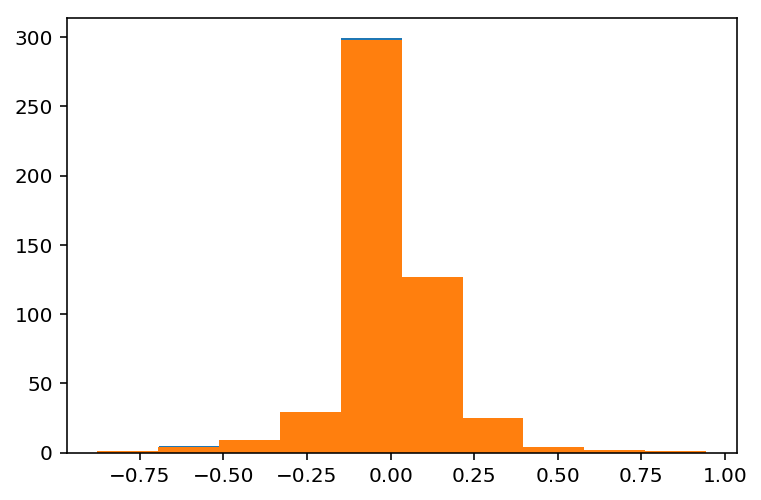

In [21]:
plt.hist(h)
plt.hist(hhat)

(array([   1.,    0.,    3.,   17.,   31.,  291.,  117.,   23.,   13.,    4.]),
 array([-0.94435245, -0.78216431, -0.61997617, -0.45778803, -0.29559989,
        -0.13341175,  0.02877638,  0.19096452,  0.35315266,  0.5153408 ,
         0.67752894]),
 <a list of 10 Patch objects>)

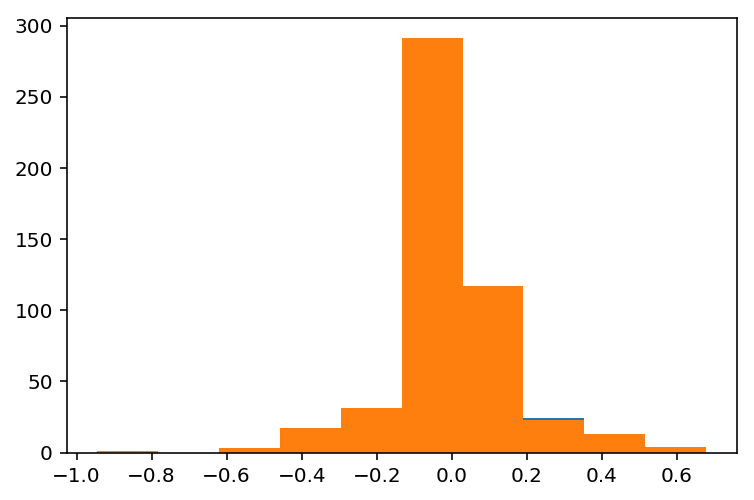

In [22]:
plt.hist(k)
plt.hist(khat)

In [23]:
'''
## One-component Gaussian Mixture Simulated Data
## Below we designate the population values of our generative model. These are the 
## truths that we should recover if our hiararchical Bayesian model is properly specified 
## and diagnostics have indicated that the simulation has "not not converged". "You can't 
## prove convergence, at best you can fail to prove a failure to converge".

## In this simulated data set, their are 50 planetary systems (with one planet each)
Ndata = 25 
## Here we asign the dispersion of the simulated population to be 0.3, this is 
## the truth we wish to recovern 
sigmae = 0.3 
## We approximate the uncertainty for each measurement as normally distributed about a 
## reporte measurement point estimate.  For the eccentricity distribution for Hot Jupiter
## the physical models used to derive these produce larger uncertainty in k by a factor of 2. 
sigmahobs = 0.04
sigmakobs = 0.08

h = np.repeat(0.,Ndata)
k = np.repeat(0.,Ndata)
hhat = np.repeat(0.,Ndata)
khat = np.repeat(0.,Ndata)
hhat_sigma  = np.repeat(sigmahobs,Ndata)
khat_sigma  = np.repeat(sigmakobs,Ndata)

#print(khat_sigma)


for i in range(0,Ndata):
    h[i] = rnorm_bound(1,0,sigmae,lower_bound=-1,upper_bound=1)
    lb = -np.sqrt(1-h[i]**2)
    ub = np.sqrt(1-h[i]**2)
    k[i] = rnorm_bound(1,0,sigmae,lower_bound=lb,upper_bound=ub) 
    hhat[i] = rnorm_bound(1,h[i],sigmahobs,lower_bound=-1,upper_bound=1)
    khat[i] = rnorm_bound(1,k[i],sigmakobs,lower_bound=lb,upper_bound=ub)

## Vizualize the true data values, and the simulated measurements:     
print(h, hhat, k, khat)
plt.hist(h)
plt.hist(hhat)
'''

'\n## One-component Gaussian Mixture Simulated Data\n## Below we designate the population values of our generative model. These are the \n## truths that we should recover if our hiararchical Bayesian model is properly specified \n## and diagnostics have indicated that the simulation has "not not converged". "You can\'t \n## prove convergence, at best you can fail to prove a failure to converge".\n\n## In this simulated data set, their are 50 planetary systems (with one planet each)\nNdata = 25 \n## Here we asign the dispersion of the simulated population to be 0.3, this is \n## the truth we wish to recovern \nsigmae = 0.3 \n## We approximate the uncertainty for each measurement as normally distributed about a \n## reporte measurement point estimate.  For the eccentricity distribution for Hot Jupiter\n## the physical models used to derive these produce larger uncertainty in k by a factor of 2. \nsigmahobs = 0.04\nsigmakobs = 0.08\n\nh = np.repeat(0.,Ndata)\nk = np.repeat(0.,Ndata)\nhhat

In [15]:
%%time
!date

eccmodel = """
data {
    int<lower=1> Nm;
    int<lower=1> Ndata;
    real<lower=-1,upper=1> hhat[Ndata];
    real<lower=0,upper=1> hhat_sigma[Ndata];
    real<lower=-1,upper=1> khat[Ndata];
    real<lower=0,upper=1> khat_sigma[Ndata];

}
parameters {
    //real<lower=0,upper=1> f;
    simplex[Nm] f;

    //positive_ordered[Nm] e_sigma;
    real<lower=0,upper=1.0> e_sigma[Nm];

    real<lower=-1,upper=1> h[Ndata];
    real<lower=-1,upper=1> k[Ndata];
}
model {
    //e_sigma ~ uniform(0, 1.0);
    
    //hhat ~ normal(h, hhat_sigma);
    //khat ~ normal(k, khat_sigma);

    for (n in 1:Ndata)
      //target += log_mix(f, normal_lpdf(h[n] | 0.0, e_sigma[1]), normal_lpdf(h[n] | 0.0, e_sigma[2]));
      target += log_mix(f[1], normal_lpdf(h[n] | 0.0, e_sigma[1]), normal_lpdf(h[n] | 0.0, e_sigma[2]));
    for (n in 1:Ndata)
      //target += log_mix(f, normal_lpdf(k[n] | 0.0, e_sigma[1]), normal_lpdf(k[n] | 0.0, e_sigma[2]));
      target += log_mix(f[1], normal_lpdf(k[n] | 0.0, e_sigma[1]), normal_lpdf(k[n] | 0.0, e_sigma[2]));
}
"""
# Compiled Stan Model
sm = StanModel(model_code=eccmodel)

!date

Thu Apr 19 22:01:57 PDT 2018
Thu Apr 19 22:02:50 PDT 2018
CPU times: user 1.93 s, sys: 340 ms, total: 2.27 s
Wall time: 53.5 s


In [24]:
%%time
!date
ecc_dat = {'Nm': 2, 'Ndata': len(hhat), 'alpha': [1], 'hhat': hhat, 'hhat_sigma': hhat_sigma, 'khat': khat, 'khat_sigma': khat_sigma}


fit = sm.sampling(data=ecc_dat, iter=1000, chains=2, seed=483892929, refresh=10, n_jobs=-1)

!date

Thu Apr 19 22:05:43 PDT 2018
Thu Apr 19 22:15:29 PDT 2018
CPU times: user 573 ms, sys: 183 ms, total: 756 ms
Wall time: 9min 45s


In [25]:
## I found Python stan_utility on Jeff Alstott's github: https://github.com/jeffalstott/pystan_time_series
## I am refereing to the Stan Case Studies for HMC diagnostics in pystan:
## http://mc-stan.org/users/documentation/case-studies/pystan_workflow.html

#help(stan_utility_copy)

Inference for Stan model: anon_model_20b407bfb6c584829c265205ce7d8257.
2 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=1000.

             mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
f[0]         0.52    0.02   0.31   0.02   0.26   0.53    0.8   0.99  240.0    1.0
f[1]         0.48    0.02   0.31   0.01    0.2   0.47   0.74   0.98  240.0    1.0
e_sigma[0]   0.21    0.02   0.08   0.06   0.15    0.2   0.26   0.36   20.0    1.1
e_sigma[1]   0.22    0.01   0.11   0.06   0.16   0.22   0.28   0.43   64.0   1.07
h[0]      -2.5e-3  7.3e-3   0.23  -0.45  -0.14-3.5e-3   0.13   0.48 1000.0    1.0
h[1]      -2.7e-3  7.1e-3   0.22  -0.46  -0.13 2.2e-3   0.13   0.44 1000.0    1.0
h[2]       5.9e-3  7.0e-3   0.22  -0.43  -0.14 3.0e-3   0.15   0.45 1000.0    1.0
h[3]       2.3e-3  7.2e-3   0.23  -0.47  -0.12 3.4e-3   0.13   0.49 1000.0    1.0
h[4]      -2.3e-3  6.6e-3   0.21  -0.41  -0.13-6.9e-4   0.13   0.43 1000.0 

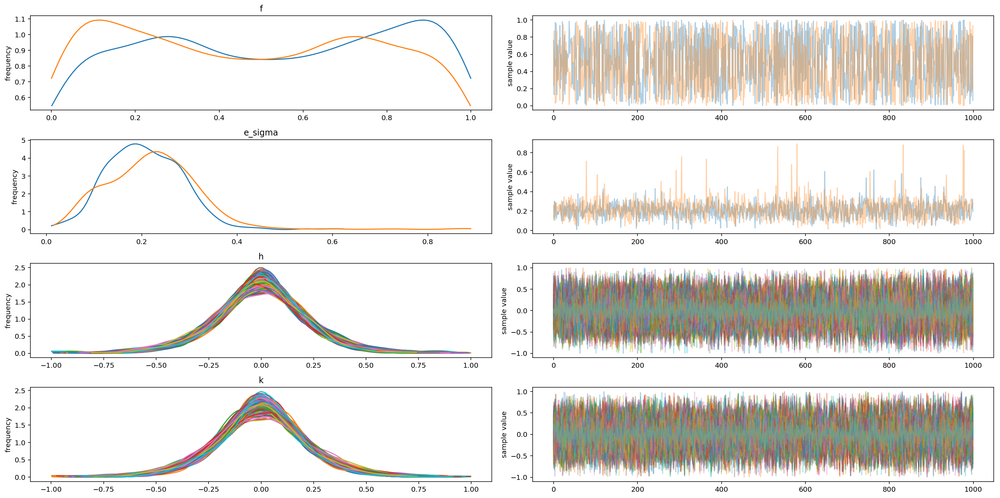

In [28]:
%%time
!date

print(fit)
stan_utility_copy.check_treedepth(fit)
stan_utility_copy.check_energy(fit)
stan_utility_copy.check_div(fit)
plt.rcParams["figure.figsize"] = (20,10)
fig = fit.traceplot()
fig.tight_layout()

!date

(1000,)
(0,)
(1000,)
(0,)


Text(0,0.5,u'e_sigma')

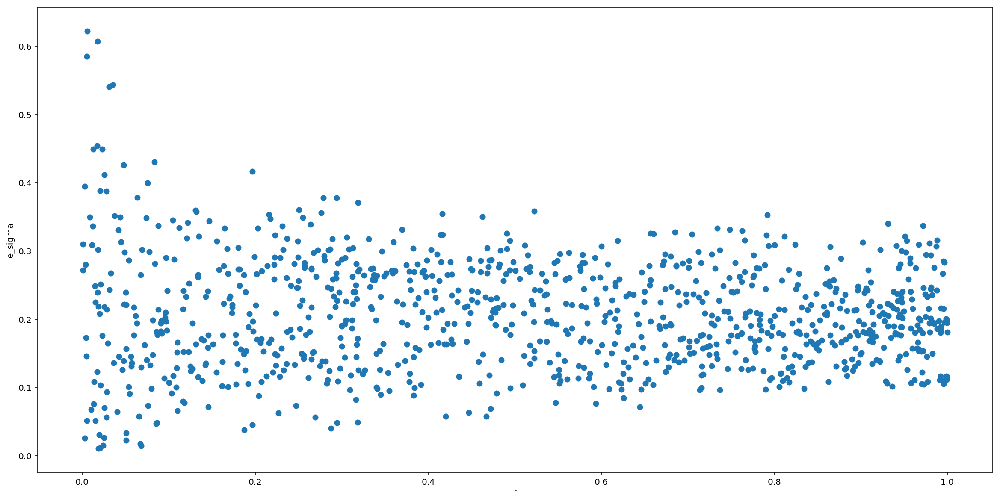

In [29]:
light="#DCBCBC"
light_highlight="#C79999"
mid="#B97C7C"
mid_highlight="#A25050"
dark="#8F2727"
dark_highlight="#7C0000"
green="#00FF00"

nondiv_params, div_params = stan_utility_copy.partition_div(fit)
print(nondiv_params['e_sigma'][:,0].shape)
print(div_params['e_sigma'][:,0].shape)
print(nondiv_params['f'][:,0].shape)
print(div_params['f'][:,0].shape)
#plt.scatter([x[0] for x in nondiv_params['f'][:,0]], nondiv_params['e_sigma'][:,0], \
             #color = mid_highlight, alpha=0.05)
#plt.scatter([x[0] for x in div_params['f'][:,0]], div_params['e_sigma'][:,0], \
             #color = green, alpha=0.5)

plt.scatter(nondiv_params['f'][:,0], nondiv_params['e_sigma'][:,0])
plt.scatter(div_params['f'][:,0], div_params['e_sigma'][:,0])

plt.gca().set_xlabel("f")
plt.gca().set_ylabel("e_sigma")



In [ ]:
%%time
!date

#fit2 = sm.sampling(data=ecc_dat, iter=10000, chains=5, seed=483892929, refresh=1000, n_jobs=-1, control=dict(adapt_delta=0.99))
fit2 = sm.sampling(data=ecc_dat, iter=10000, chains=4, seed=483892929, refresh=100, n_jobs=-1)

!date

Thu Apr 19 15:38:21 PDT 2018


Inference for Stan model: anon_model_8f06f1df9a604bd0064d77613324622a.
4 chains, each with iter=5000; warmup=2500; thin=1; 
post-warmup draws per chain=2500, total post-warmup draws=10000.

             mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
f             0.5  8.4e-3   0.31   0.02   0.22   0.49   0.79   0.98 1369.0    1.0
e_sigma[0]   0.29  8.2e-3   0.19   0.03   0.14   0.26   0.39    0.8  541.0   1.01
e_sigma[1]   0.28  6.8e-3   0.19   0.03   0.14   0.25   0.38   0.78  773.0   1.01
h[0]      -1.5e-3  2.6e-3   0.26  -0.58  -0.12-5.5e-4   0.12   0.56  10000    1.0
h[1]       9.3e-4  2.6e-3   0.26  -0.57  -0.13-2.0e-4   0.13   0.57  10000    1.0
h[2]      -3.3e-3  2.6e-3   0.26  -0.58  -0.13 5.7e-4   0.12   0.58  10000    1.0
h[3]      -7.6e-4  2.6e-3   0.26  -0.58  -0.13-1.3e-3   0.12   0.58  10000    1.0
h[4]       5.3e-3  2.6e-3   0.26  -0.54  -0.12 5.4e-4   0.13   0.58  10000    1.0
h[5]       1.6e-4  2.6e-3   0.26  -0.57  -0.12-6.3e-4   0.12   0.58  100

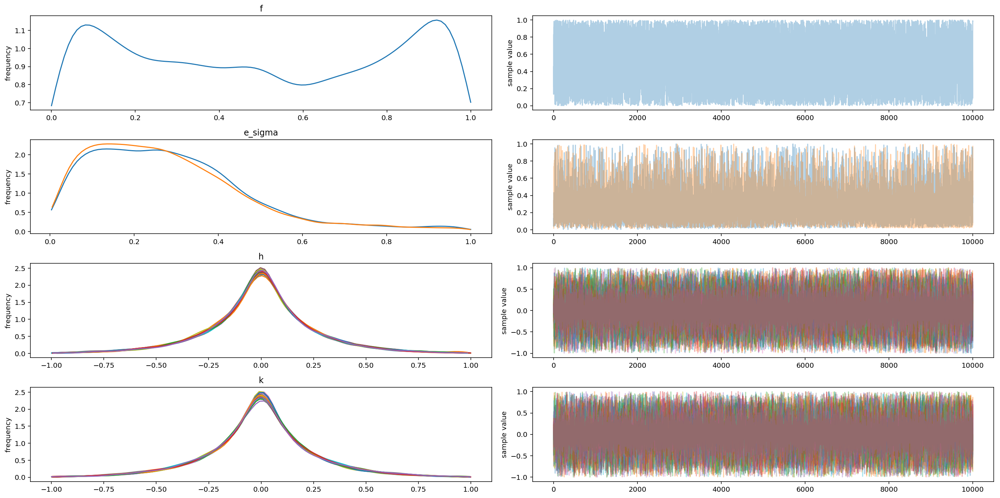

In [15]:
print(fit2)
stan_utility_copy.check_treedepth(fit2)
stan_utility_copy.check_energy(fit2)
stan_utility_copy.check_div(fit2)
plt.rcParams["figure.figsize"] = (20,10)
fig2 = fit2.traceplot()
fig2.tight_layout()


(23956,)
(1044,)
(23956,)
(1044,)


Text(0,0.5,u'e_sigma')

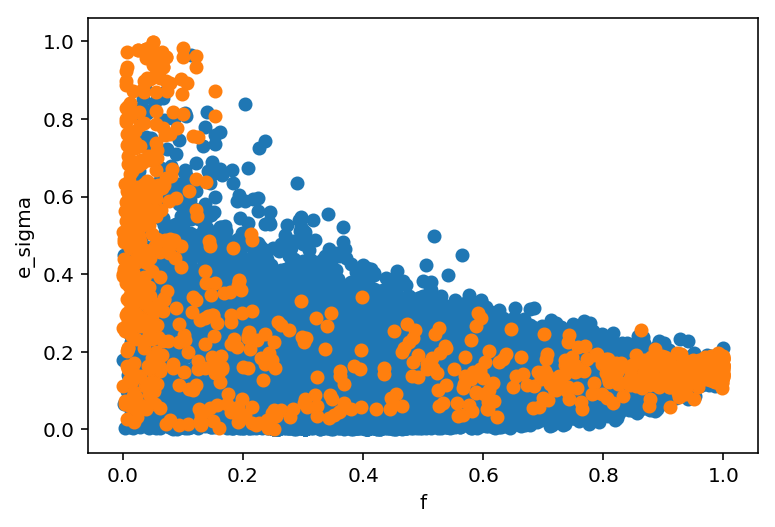

In [17]:
light="#DCBCBC"
light_highlight="#C79999"
mid="#B97C7C"
mid_highlight="#A25050"
dark="#8F2727"
dark_highlight="#7C0000"
green="#00FF00"

nondiv_params, div_params = stan_utility_copy.partition_div(fit2)
print(nondiv_params['e_sigma'][:,0].shape)
print(div_params['e_sigma'][:,0].shape)
print(nondiv_params['f'][:,0].shape)
print(div_params['f'][:,0].shape)
#plt.scatter([x[0] for x in nondiv_params['f'][:,0]], nondiv_params['e_sigma'][:,0], \
             #color = mid_highlight, alpha=0.05)
#plt.scatter([x[0] for x in div_params['f'][:,0]], div_params['e_sigma'][:,0], \
             #color = green, alpha=0.5)

plt.scatter(nondiv_params['f'][:,0], nondiv_params['e_sigma'][:,0])
plt.scatter(div_params['f'][:,0], div_params['e_sigma'][:,0])

plt.gca().set_xlabel("f")
plt.gca().set_ylabel("e_sigma")


In [18]:
num_chains = 5
samples_Stan = fit2.extract(permuted=True)
print(type(samples_Stan['e_sigma'][:,0]))
print(samples_Stan.items())

for j, i in samples_Stan.items():
    print(j)
    print(i.shape)
    



<type 'numpy.ndarray'>
[(u'f', array([[ 0.23043932,  0.76956068],
       [ 0.66032301,  0.33967699],
       [ 0.19621824,  0.80378176],
       ..., 
       [ 0.66677329,  0.33322671],
       [ 0.44949756,  0.55050244],
       [ 0.50778411,  0.49221589]])), (u'e_sigma', array([[ 0.0606596 ,  0.18581767],
       [ 0.07257823,  0.25502167],
       [ 0.25965661,  0.07174546],
       ..., 
       [ 0.19239754,  0.02148001],
       [ 0.25209581,  0.05691713],
       [ 0.04067172,  0.2181966 ]])), (u'h', array([[-0.42255858,  0.38368089,  0.04003213, ...,  0.01491814,
         0.31688793, -0.05068141],
       [-0.40024233,  0.36079388,  0.01754338, ..., -0.01744457,
         0.31001199, -0.12826747],
       [-0.44431877,  0.34869748, -0.02840499, ...,  0.04447592,
         0.22823726, -0.04268776],
       ..., 
       [-0.43689658,  0.41700022,  0.02197794, ...,  0.00785484,
         0.3149313 , -0.12732388],
       [-0.47350046,  0.34480631,  0.08218365, ...,  0.01848568,
         0.34046384

In [19]:

e_sigma_1 = samples_Stan['e_sigma'][:,0]
f_1 = samples_Stan['f'][:,0]
e_sigma_2 = samples_Stan['e_sigma'][:,1]
f_2 = samples_Stan['f'][:,1]

print( np.hstack(( f_1.reshape(-1,1), e_sigma_1.reshape(-1,1), f_2.reshape(-1,1), e_sigma_2.reshape(-1,1) )) ) 

# Sort the sigma high and sigma low values:
e_sigma_low = np.minimum(e_sigma_1,e_sigma_2)
e_sigma_hi = np.maximum(e_sigma_1,e_sigma_1)
 
e_sigma_low = np.where(e_sigma_1 <= e_sigma_2, e_sigma_1, e_sigma_2)
e_sigma_hi = np.where(e_sigma_1 > e_sigma_2, e_sigma_1, e_sigma_2)
f_low = np.where(e_sigma_1 <= e_sigma_2, f_1, f_2)
f_high = np.where(e_sigma_1 > e_sigma_2, f_1, f_2)

print( np.hstack(( f_low.reshape(-1,1), e_sigma_low.reshape(-1,1), f_high.reshape(-1,1), e_sigma_hi.reshape(-1,1) )) ) 


[[ 0.23043932  0.0606596   0.76956068  0.18581767]
 [ 0.66032301  0.07257823  0.33967699  0.25502167]
 [ 0.19621824  0.25965661  0.80378176  0.07174546]
 ..., 
 [ 0.66677329  0.19239754  0.33322671  0.02148001]
 [ 0.44949756  0.25209581  0.55050244  0.05691713]
 [ 0.50778411  0.04067172  0.49221589  0.2181966 ]]
[[ 0.23043932  0.0606596   0.76956068  0.18581767]
 [ 0.66032301  0.07257823  0.33967699  0.25502167]
 [ 0.80378176  0.07174546  0.19621824  0.25965661]
 ..., 
 [ 0.33322671  0.02148001  0.66677329  0.19239754]
 [ 0.55050244  0.05691713  0.44949756  0.25209581]
 [ 0.50778411  0.04067172  0.49221589  0.2181966 ]]


In [20]:
## Print and check the shape of the resultant samples dictionary:
#print(samples)
#print(samples.items())
print('-----')
print(samples_Stan['e_sigma'].shape)
print(samples_Stan['h'].shape)
print(samples_Stan['h'][:,3].shape)
print('-----')


## Update the samples dictionary so that it includes keys for the latent variables
## Also, we will use LaTeX formatting to help make legible plots ahead.  
samples_Nm2_Stan = {}

## adjust the thin varible to only look at every #th population element 
thin1 = 1

## Need to enter the number of hyperparameter variables here:
numHyperParams = 4

## Specify the dimension we want for our plot below, for legibility.  
dim1 = (Ndata/thin1) + numHyperParams
print(dim1)

for i in np.arange(0,Ndata,thin1):
    samples_Nm2_Stan.update({'$h_{'+str(i+1)+'}$': samples_Stan['h'][:,i],'$k_{'+str(i+1)+'}$': samples_Stan['k'][:,i]})
## Add the hyperparameter marginal posterior back in:
samples_Nm2_Stan.update({'$e_{\sigma_{low}}$': e_sigma_low})
samples_Nm2_Stan.update({'$e_{\sigma_{high}}$': e_sigma_hi})
samples_Nm2_Stan.update({'$f_{low}$': f_low})
samples_Nm2_Stan.update({'$f_{high}$': f_high})
#print(samples_Nm2_Stan['$h_{5}$'].shape)

## Reshape values for diagnostic plot functions (trace, autocorrelation) below:  
samples_Nm2_trace_Stan = {}    
for j, i in samples_Nm2_Stan.items():
    samples_Nm2_trace_Stan.update({str(j): i.reshape(int(len(i)/num_chains),-1)})


-----
(25000, 2)
(25000, 25)
(25000,)
-----
29.0


Wed Jan 31 14:00:40 PST 2018
Variable
$e_{\sigma_{high}}$    0.241730
$e_{\sigma_{low}}$     0.068463
$f_{high}$             0.460868
$f_{low}$              0.539132
$h_{10}$              -0.019368
$h_{11}$              -0.019550
$h_{12}$               0.321868
$h_{13}$               0.000446
$h_{14}$               0.059709
$h_{15}$              -0.006735
$h_{16}$               0.044397
$h_{17}$               0.126249
$h_{18}$               0.031615
$h_{19}$              -0.060579
$h_{1}$               -0.411284
$h_{20}$               0.009584
$h_{21}$              -0.051089
$h_{22}$               0.213323
$h_{23}$               0.069087
$h_{24}$               0.306622
$h_{25}$              -0.080833
$h_{2}$                0.351905
$h_{3}$                0.040636
$h_{4}$                0.031326
$h_{5}$                0.014187
$h_{6}$                0.081341
$h_{7}$                0.108490
$h_{8}$                0.020359
$h_{9}$                0.006042
$k_{10}$              -0.015503
$k

//anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


CPU times: user 1min 37s, sys: 2.91 s, total: 1min 40s
Wall time: 1min 43s


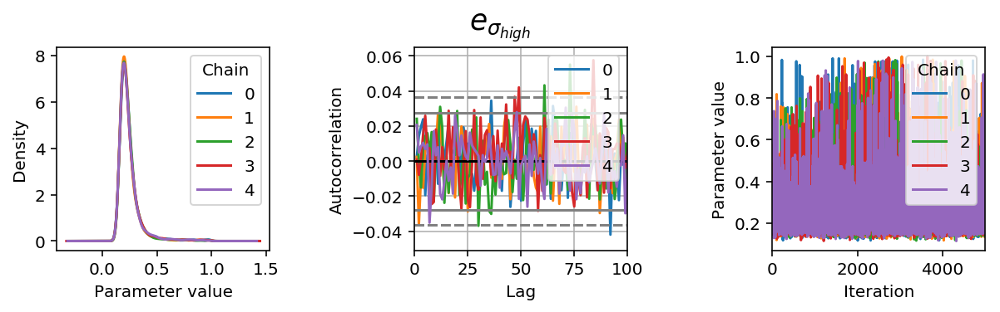

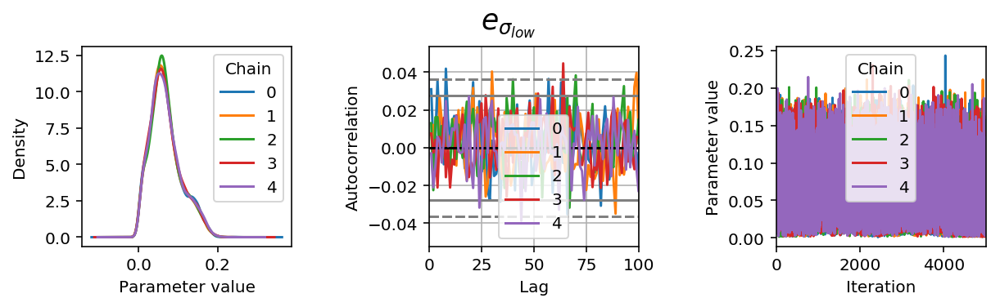

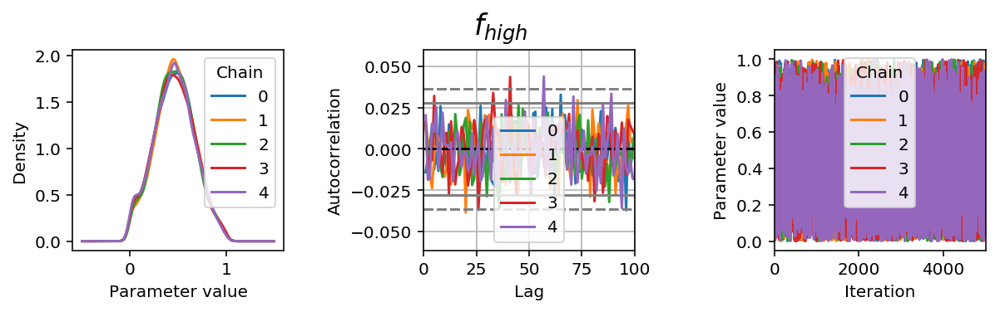

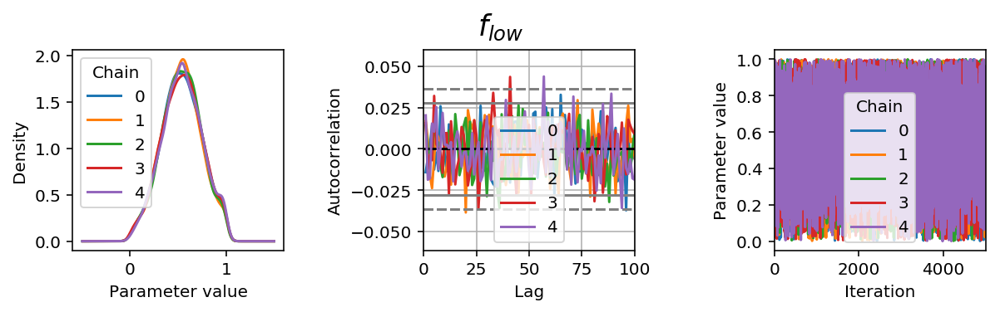

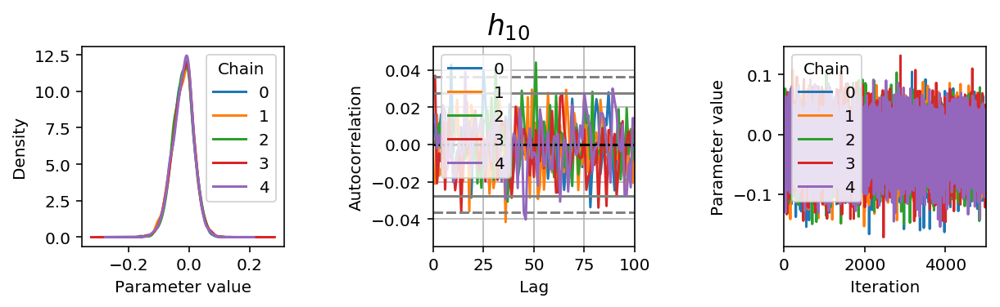

...

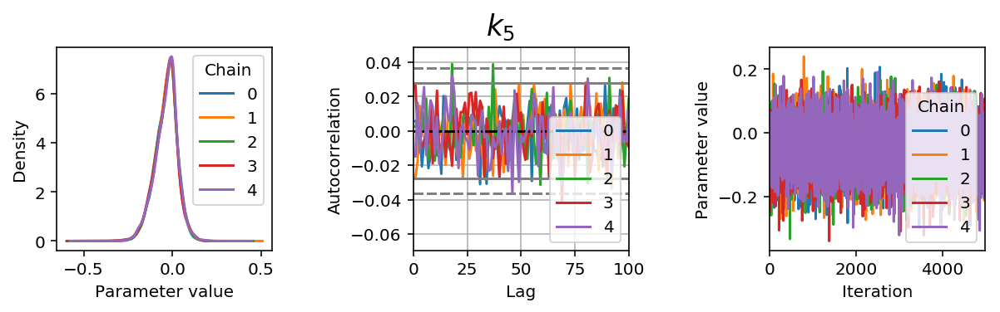

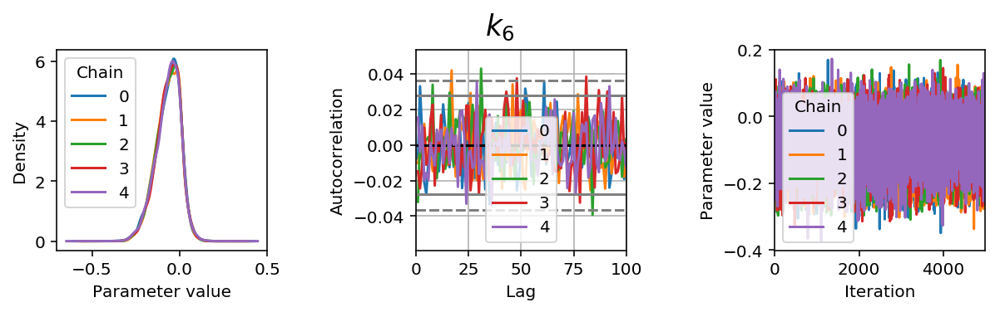

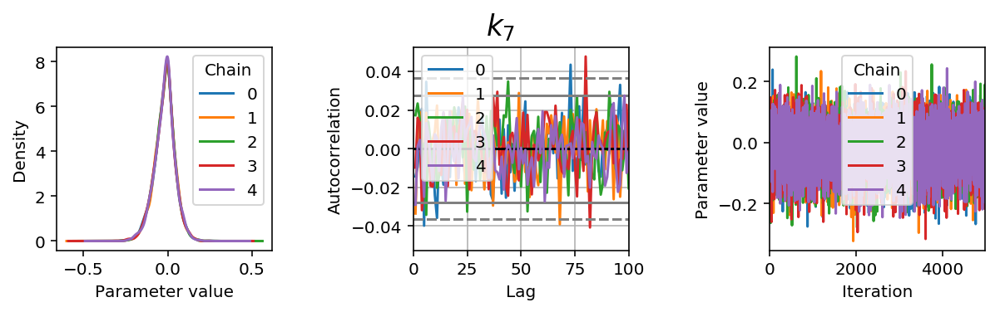

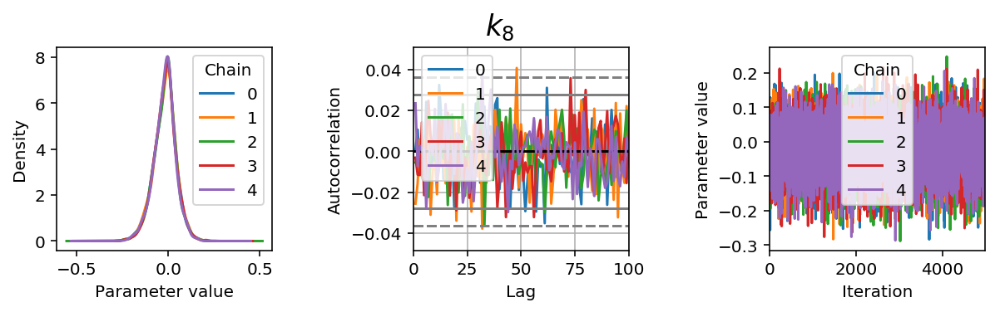

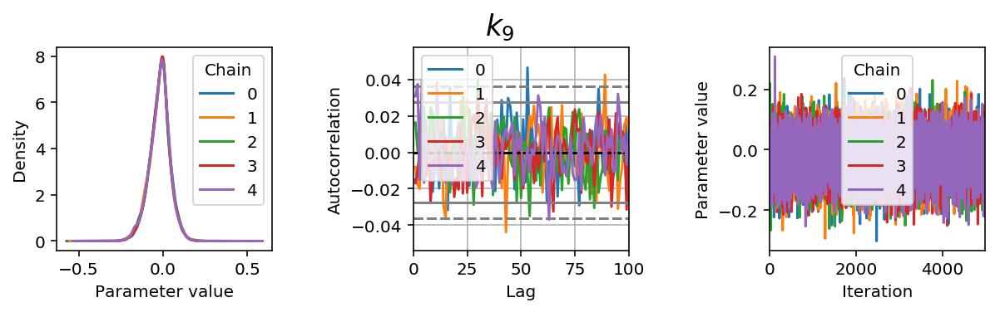

In [21]:
%%time
!date
## Use pandas three dimensional Panel to represent the trace:

trace_1_Stan = pd.Panel({k: v for k, v in samples_Nm2_trace_Stan.items()})
trace_1_Stan.axes[0].name = 'Variable'
trace_1_Stan.axes[1].name = 'Iteration'
trace_1_Stan.axes[2].name = 'Chain'
 
## Point estimates:
print(trace_1_Stan.to_frame().mean())
 
## Bayesian equal-tailed 95% credible intervals:
print(trace_1_Stan.to_frame().quantile([0.05, 0.95]))
  ## ^ entering the values here could be a good question part
    
def plot(trace, var):
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(var, y=0.95, fontsize='xx-large')
 
    ## Marginal posterior density estimate:
    trace[var].plot.density(ax=axes[0])
    axes[0].set_xlabel('Parameter value')
    axes[0].locator_params(tight=True)
 
    ## Autocorrelation for each chain:
    axes[1].set_xlim(0, 100)
    for chain in trace[var].columns:
        autocorrelation_plot(trace[var,:,chain], axes[1], label=chain)
 
    ## Trace plot:
    axes[2].set_ylabel('Parameter value')
    trace[var].plot(ax=axes[2])
 
    ## Save figure
    filename = var.replace("\\", "") 
    filename = filename.replace("$", "") 
    filename = filename.replace("}", "") 
    filename = filename.replace("{", "") 
    plt.tight_layout(pad=3)
    fig.savefig('{}.png'.format(filename))
!date
# Display diagnostic plots
for var in trace_1_Stan:
    plot(trace_1_Stan, var);
 



In [ ]:
## adjust the thin varible to only look at every #th population element 
##Ndata is 25 use 
thin = 5
##Ndata is 20 use
#thin = 4
numHyperParams = 4

## Re-specify the dimension we want for our plot below, with thinning, for legibility.  
dim2 = int((Ndata/thin) + numHyperParams)
print(dim2)
print(k)
samples_Nm2_triangle_1_Stan = {}
truths_hhat = {}
truths_h = {}
for i in np.arange(0,Ndata,thin):
    print(i)
    print(samples_Stan['h'][:,i])
    print(samples_Stan['k'][:,i])
    print(h[i])
    print(k[i])
    print(hhat[i])
    print(khat[i])
    samples_Nm2_triangle_1_Stan.update({'$h_{'+str(i+1)+'}$': samples_Stan['h'][:,i],'$k_{'+str(i+1)+'}$': samples_Stan['k'][:,i]})
    truths_hhat.update({'$h_{'+str(i+1)+'}$': hhat[i],'$k_{'+str(i+1)+'}$': khat[i]})
    truths_h.update({'$h_{'+str(i+1)+'}$': h[i],'$k_{'+str(i+1)+'}$': k[i]})
samples_Nm2_triangle_1_Stan.update({'$e_{\sigma_{low}}$': e_sigma_low,'$e_{\sigma_{high}}$': e_sigma_hi,'$f_{low}$': f_low,'$f_{high}$': f_high})
truths_hhat.update({'$e_{\sigma_{low}}$': e_sigma_low,'$e_{\sigma_{high}}$': e_sigma_hi,'$f_{low}$': f_low,'$f_{high}$': f_high})
truths_h.update({'$e_{\sigma_{low}}$': e_sigma_low,'$e_{\sigma_{high}}$': e_sigma_hi,'$f_{low}$': f_low,'$f_{high}$': f_high})



In [ ]:
print(samples_Nm2_triangle_1_Stan.keys())
print(int(dim2))
print(truths_hhat.values())

In [ ]:
%%time
!date

import triangle_linear
#data = np.asarray(samples_Nm1_scatter_matrix_triangle.values()).reshape((5000*num_chains),int(dim2))
#print(np.asarray(samples_Nm1_scatter_matrix_triangle.values()).reshape((5000*num_chains),int(dim2)).shape)

samples_Nm2_triangle_2_Stan = {}    
for j, i in samples_Nm2_triangle_1_Stan.items():
    samples_Nm2_triangle_2_Stan.update({str(j): i.reshape(-1,1)})
    
data = None
for k, v in samples_Nm2_triangle_2_Stan.items():
    column = v.reshape(-1,1)
    if data is None:
        data = column
    else:
        data = np.hstack((data, column))

print(data[:].shape)
print(len(truths_hhat.keys()))
print(len(samples_Nm2_triangle_2_Stan.keys()
!date

In [ ]:
%%time
!date

figure = triangle_linear.corner(data,labels=samples_Nm2_triangle_2_Stan.keys(),labelsy=samples_Nm2_triangle_2_Stan.keys(), truths=truths_hhat.values(), truths_color = 'black')

plt.savefig('triangle_linear_Nm2_Stan.png')

!date

<h2 align="center">Part 2: Explore Matt Trick or non-centered parameterization </h2>

This is probably not necessary for this model.  The generative model is Normal centered at zero.  

In [ ]:
eccmodel = """
data {
    int<lower=1> Nm;
    int<lower=1> Ndata;
    real<lower=-1,upper=1> hhat[Ndata];
    real<lower=0,upper=1> hhat_sigma[Ndata];
}

parameters {
    simplex[2] f;
    real<lower=0> e_sigma[2];
    real<lower=-1,upper=1> h[Ndata];
    real h_tilde[Ndata];

}


model {
    e_sigma ~ uniform(0, 1.0);
    h_tilde ~ normal(0, 1);

    for (n in 1:Ndata)
      hhat[n] ~ normal(h[n], hhat_sigma[n]);

    for (n in 1:Ndata)
      increment_log_prob(log_mix(f[1], normal_log(h[n], 0.0, e_sigma[1] * h_tilde[n]), normal_log(h[n], 0.0, e_sigma[2] * h_tilde[n])));
}
"""
# Compiled Stan Model
sm = StanModel(model_code=eccmodel)